In [1]:
import os
import numpy as np 
import pandas as pd 
import torch
import torch.nn as nn

# 1. Verify and print GPU availability
device_count = torch.cuda.device_count()
print(f"Number of available GPUs: {device_count}")

if device_count > 1:
    for i in range(device_count):
        print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
    # Use standard cuda device indicator
    device = torch.device("cuda")
else:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

# 2. How to wrap your future model for Dual-GPU use
# (Run this step later in your notebook once you define your neural network)
def prepare_model_for_dual_gpu(model):
    if torch.cuda.device_count() > 1:
        print("Wrapping model with nn.DataParallel to use BOTH T4 GPUs!")
        # DataParallel splits the input batch across both GPUs automatically
        model = nn.DataParallel(model)
    return model.to(device)

Number of available GPUs: 2
GPU 0: Tesla T4
GPU 1: Tesla T4


In [2]:
import os
import random
import hashlib
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageFile
from tqdm.auto import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

ImageFile.LOAD_TRUNCATED_IMAGES = True

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

sns.set_theme(style="whitegrid", context="notebook")
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns", 30)

In [3]:
DATA_DIR = Path(
    "/kaggle/input/datasets/tashiee/malebin-malware-binary-greyscale-images"
)

if not DATA_DIR.exists():
    DATA_DIR = Path("/kaggle/input/malebin-malware-binary-greyscale-images")

IMAGE_EXTENSIONS = {
    ".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff", ".gif", ".webp"
}

print("dataset path:", DATA_DIR)
print("exists:", DATA_DIR.exists())

dataset path: /kaggle/input/datasets/tashiee/malebin-malware-binary-greyscale-images
exists: True


In [4]:
def find_class_dirs(root):
    class_dirs = []

    for folder, _, files in os.walk(root):
        has_image = any(Path(name).suffix.lower() in IMAGE_EXTENSIONS for name in files)

        if has_image:
            class_dirs.append(Path(folder))

    return sorted(class_dirs)


class_dirs = find_class_dirs(DATA_DIR)

records = []

for class_dir in tqdm(class_dirs, desc="reading folders"):
    label = class_dir.relative_to(DATA_DIR).as_posix()

    for file_path in class_dir.iterdir():
        if file_path.is_file() and file_path.suffix.lower() in IMAGE_EXTENSIONS:
            records.append(
                {
                    "path": str(file_path),
                    "filename": file_path.name,
                    "label": label,
                    "extension": file_path.suffix.lower(),
                    "file_size_kb": file_path.stat().st_size / 1024,
                }
            )

df = pd.DataFrame(records)

print("total images:", f"{len(df):,}")
print("total classes:", df["label"].nunique())
print("image formats:", df["extension"].nunique())

df.head()

reading folders:   0%|          | 0/39 [00:00<?, ?it/s]

total images: 12,464
total classes: 39
image formats: 1


,path,filename,label,extension,file_size_kb
0,/kaggle/input/datasets/tashiee/malebin-malware...,0528185d9960c8bd1b6692d2ccc8b9dd.png,Malware_Merge/Adialer.C,.png,43.902344
1,/kaggle/input/datasets/tashiee/malebin-malware...,050f962b76f3b115044873d9e3a07a97.png,Malware_Merge/Adialer.C,.png,43.903320
2,/kaggle/input/datasets/tashiee/malebin-malware...,053f41978f89e436244c691072f4a548.png,Malware_Merge/Adialer.C,.png,43.495117
3,/kaggle/input/datasets/tashiee/malebin-malware...,06e21af7e2fdd67622d0122e113b0d53.png,Malware_Merge/Adialer.C,.png,43.627930
4,/kaggle/input/datasets/tashiee/malebin-malware...,01691141ed365252bbe290bb7841c0c5.png,Malware_Merge/Adialer.C,.png,43.410156


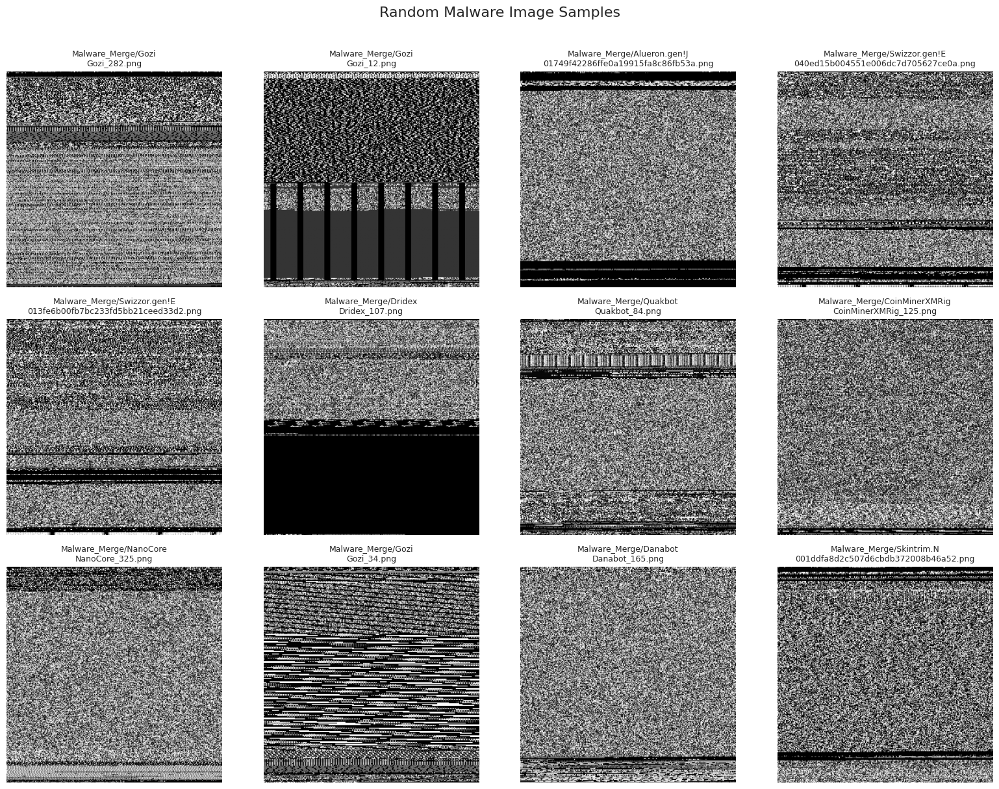

In [5]:
N_IMAGES = 12
N_COLS = 4
N_ROWS = int(np.ceil(N_IMAGES / N_COLS))

sample_images = df.sample(
    n=min(N_IMAGES, len(df)),
    random_state=SEED
).reset_index(drop=True)

fig, axes = plt.subplots(
    N_ROWS,
    N_COLS,
    figsize=(16, N_ROWS * 4)
)

axes = np.array(axes).reshape(-1)

for ax, row in zip(axes, sample_images.itertuples(index=False)):
    try:
        with Image.open(row.path) as image:
            ax.imshow(image.convert("L"), cmap="gray")

        ax.set_title(
            f"{row.label}\n{row.filename}",
            fontsize=9
        )

    except Exception as error:
        ax.text(
            0.5,
            0.5,
            f"Cannot load image\n{error}",
            ha="center",
            va="center"
        )

    ax.axis("off")

for ax in axes[len(sample_images):]:
    ax.axis("off")

plt.suptitle("Random Malware Image Samples", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

In [6]:
class_summary = (
    df.groupby("label")
    .agg(
        images=("path", "count"),
        total_size_mb=("file_size_kb", lambda x: x.sum() / 1024),
        avg_file_size_kb=("file_size_kb", "mean"),
        min_file_size_kb=("file_size_kb", "min"),
        max_file_size_kb=("file_size_kb", "max"),
    )
    .sort_values("images", ascending=False)
    .reset_index()
)

class_summary["share_percent"] = (
    class_summary["images"] / class_summary["images"].sum() * 100
).round(2)

class_summary.index = class_summary.index + 1
class_summary

,label,images,total_size_mb,avg_file_size_kb,min_file_size_kb,max_file_size_kb,share_percent
1,Malware_Merge/Allaple.A,1000,57.240980,58.614764,44.502930,61.573242,8.02
2,Malware_Merge/Allaple.L,1000,37.778240,38.684918,36.494141,39.373047,8.02
3,Malware_Merge/Yuner.A,800,39.554596,50.629883,50.629883,50.629883,6.42
4,Malware_Merge/Dridex,500,14.383687,29.457791,9.671875,62.267578,4.01
5,Malware_Merge/Gozi,500,15.088941,30.902150,4.249023,62.849609,4.01
6,Malware_Merge/Danabot,500,30.311036,62.077002,38.821289,64.356445,4.01
7,Malware_Merge/Quakbot,500,21.581894,44.199719,4.145508,64.160156,4.01
8,Malware_Merge/RecordBreaker,500,23.502500,48.133119,11.610352,64.337891,4.01
9,Malware_Merge/Trickbot,500,21.696011,44.433430,13.182617,62.345703,4.01
10,Malware_Merge/NanoCore,500,25.591500,52.411393,0.211914,64.306641,4.01


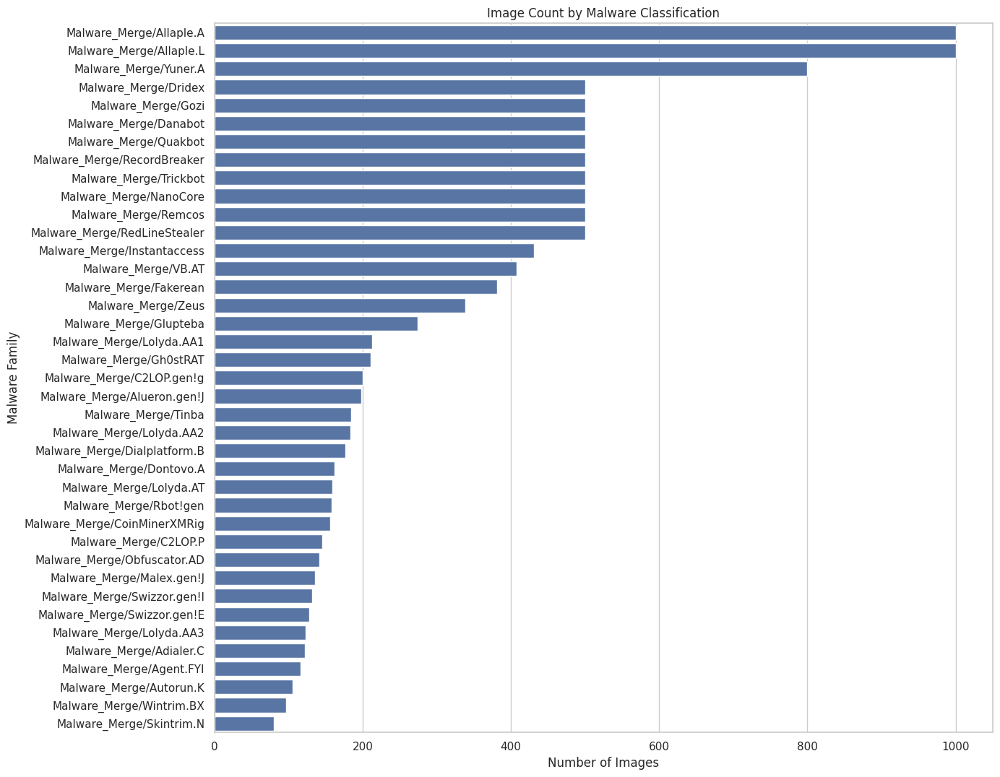

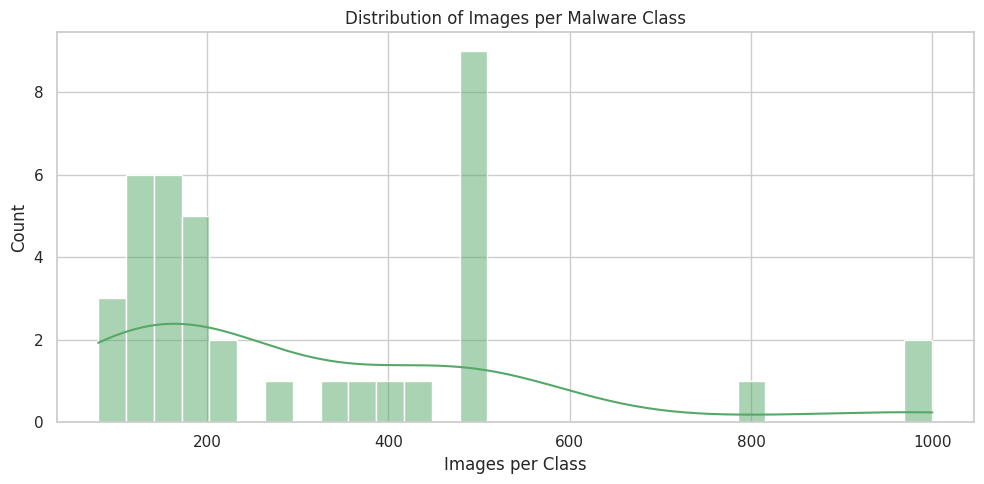

largest class: Malware_Merge/Allaple.A
largest class images: 1000
smallest class images: 80
imbalance ratio: 12.5


In [7]:
plt.figure(figsize=(14, max(8, len(class_summary) * 0.28)))

sns.barplot(
    data=class_summary,
    y="label",
    x="images",
    color="#4C72B0"
)

plt.title("Image Count by Malware Classification")
plt.xlabel("Number of Images")
plt.ylabel("Malware Family")
plt.tight_layout()
plt.show()


plt.figure(figsize=(10, 5))

sns.histplot(
    class_summary["images"],
    bins=min(30, len(class_summary)),
    kde=True,
    color="#55A868"
)

plt.title("Distribution of Images per Malware Class")
plt.xlabel("Images per Class")
plt.tight_layout()
plt.show()


imbalance_ratio = class_summary["images"].max() / class_summary["images"].min()

print("largest class:", class_summary.iloc[0]["label"])
print("largest class images:", int(class_summary["images"].max()))
print("smallest class images:", int(class_summary["images"].min()))
print("imbalance ratio:", round(imbalance_ratio, 2))

In [8]:
metadata = []
corrupt_files = []

for row in tqdm(df.itertuples(index=False), total=len(df), desc="checking images"):
    try:
        with Image.open(row.path) as image:
            image.verify()

        with Image.open(row.path) as image:
            width, height = image.size
            mode = image.mode

        metadata.append(
            {
                "path": row.path,
                "label": row.label,
                "width": width,
                "height": height,
                "aspect_ratio": round(width / height, 4) if height else np.nan,
                "mode": mode,
                "pixels": width * height,
            }
        )

    except Exception as error:
        corrupt_files.append(
            {
                "path": row.path,
                "label": row.label,
                "error": str(error),
            }
        )

image_meta = pd.DataFrame(metadata)
corrupt_df = pd.DataFrame(corrupt_files)

print("valid images:", f"{len(image_meta):,}")
print("corrupt/unreadable images:", f"{len(corrupt_df):,}")

if len(corrupt_df):
    display(corrupt_df.head())

checking images:   0%|          | 0/12464 [00:00<?, ?it/s]

valid images: 12,464
corrupt/unreadable images: 0


image modes:


,mode,count
0,L,12464



most common resolutions:


,width,height,count
0,256,256,12464


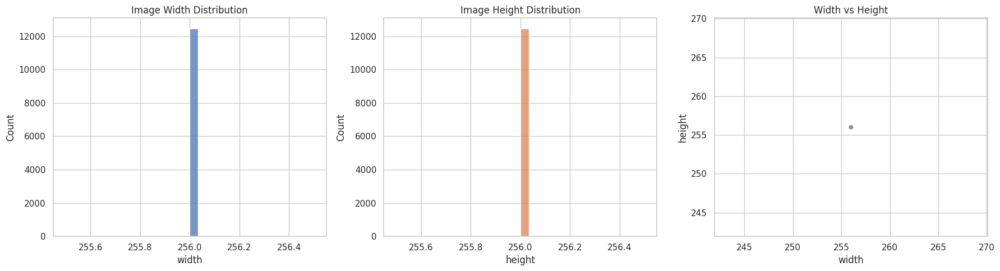

In [9]:
print("image modes:")
display(image_meta["mode"].value_counts().rename_axis("mode").reset_index(name="count"))

print("\nmost common resolutions:")
display(
    image_meta.groupby(["width", "height"])
    .size()
    .sort_values(ascending=False)
    .head(20)
    .rename("count")
    .reset_index()
)


fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.histplot(image_meta["width"], bins=30, ax=axes[0], color="#4C72B0")
axes[0].set_title("Image Width Distribution")

sns.histplot(image_meta["height"], bins=30, ax=axes[1], color="#DD8452")
axes[1].set_title("Image Height Distribution")

sns.scatterplot(
    data=image_meta.sample(min(5000, len(image_meta)), random_state=SEED),
    x="width",
    y="height",
    hue="label",
    legend=False,
    alpha=0.45,
    ax=axes[2]
)
axes[2].set_title("Width vs Height")

plt.tight_layout()
plt.show()

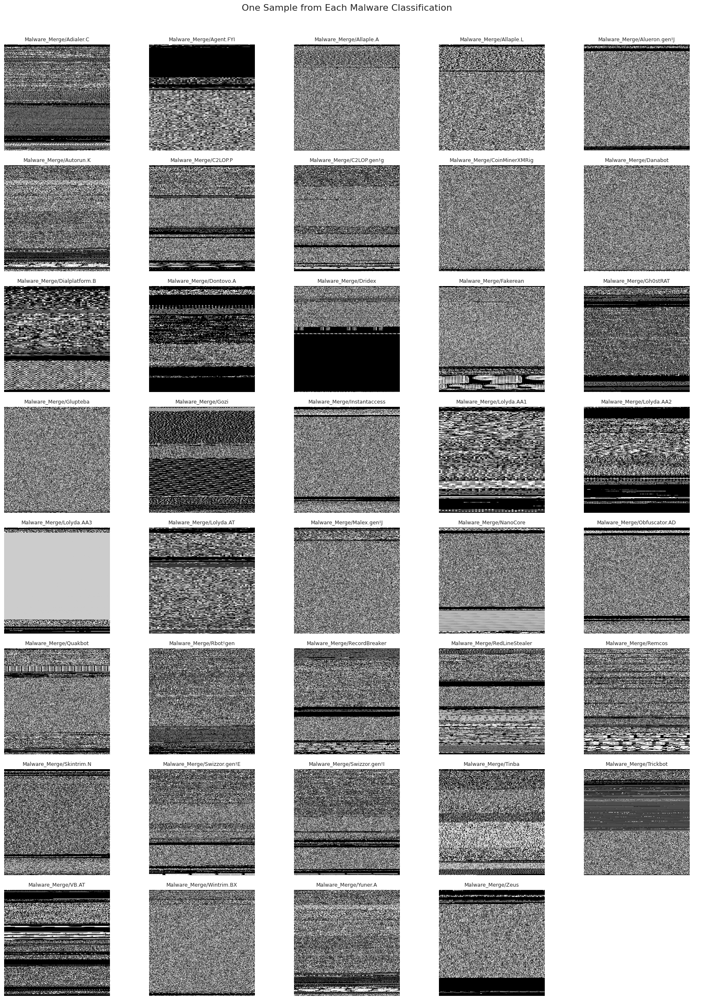

In [10]:
labels = sorted(df["label"].unique())
n_cols = 5
n_rows = int(np.ceil(len(labels) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, max(4, n_rows * 3)))
axes = np.array(axes).reshape(-1)

for ax, label in zip(axes, labels):
    image_path = df.loc[df["label"] == label, "path"].sample(
        1, random_state=SEED
    ).iloc[0]

    with Image.open(image_path) as image:
        ax.imshow(image.convert("L"), cmap="gray")

    ax.set_title(label, fontsize=9)
    ax.axis("off")

for ax in axes[len(labels):]:
    ax.axis("off")

plt.suptitle("One Sample from Each Malware Classification", y=1.01, fontsize=16)
plt.tight_layout()
plt.show()

In [11]:
SAMPLES_PER_CLASS = 80

sample_df = (
    df.groupby("label", group_keys=False)
    .apply(
        lambda group: group.sample(
            n=min(SAMPLES_PER_CLASS, len(group)),
            random_state=SEED
        )
    )
    .reset_index(drop=True)
)

pixel_records = []

for row in tqdm(sample_df.itertuples(index=False), total=len(sample_df), desc="pixel analysis"):
    try:
        with Image.open(row.path) as image:
            array = np.asarray(image.convert("L"), dtype=np.float32)

        histogram = np.bincount(array.astype(np.uint8).ravel(), minlength=256)
        probabilities = histogram / histogram.sum()
        probabilities = probabilities[probabilities > 0]
        entropy = -(probabilities * np.log2(probabilities)).sum()

        pixel_records.append(
            {
                "path": row.path,
                "label": row.label,
                "pixel_mean": array.mean(),
                "pixel_std": array.std(),
                "pixel_min": array.min(),
                "pixel_max": array.max(),
                "dark_pixel_ratio": (array < 50).mean(),
                "bright_pixel_ratio": (array > 205).mean(),
                "entropy": entropy,
            }
        )

    except Exception:
        pass

pixel_df = pd.DataFrame(pixel_records)

pixel_summary = (
    pixel_df.groupby("label")
    .agg(
        samples=("path", "count"),
        mean_intensity=("pixel_mean", "mean"),
        intensity_std=("pixel_std", "mean"),
        mean_entropy=("entropy", "mean"),
        dark_ratio=("dark_pixel_ratio", "mean"),
        bright_ratio=("bright_pixel_ratio", "mean"),
    )
    .sort_values("mean_entropy", ascending=False)
)

pixel_summary.round(4)

/tmp/ipykernel_23/3612454842.py:5: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(


pixel analysis:   0%|          | 0/3120 [00:00<?, ?it/s]

,samples,mean_intensity,intensity_std,mean_entropy,dark_ratio,bright_ratio
label,,,,,,
Malware_Merge/Danabot,80,123.238899,76.109901,7.8946,0.2204,0.1886
Malware_Merge/Allaple.A,80,123.495300,76.417900,7.8917,0.2225,0.1898
Malware_Merge/Malex.gen!J,80,121.523598,76.334503,7.8652,0.2225,0.1845
Malware_Merge/Wintrim.BX,80,121.610397,76.306000,7.8622,0.2260,0.1841
Malware_Merge/Allaple.L,80,122.356300,76.983704,7.8421,0.2299,0.1876
Malware_Merge/Instantaccess,80,120.695198,78.335999,7.8182,0.2416,0.1885
Malware_Merge/Glupteba,80,120.585503,75.746002,7.7757,0.2393,0.1865
Malware_Merge/Obfuscator.AD,80,117.980103,79.903297,7.7020,0.2607,0.1852
Malware_Merge/Fakerean,80,119.722397,80.834801,7.6172,0.2600,0.1916


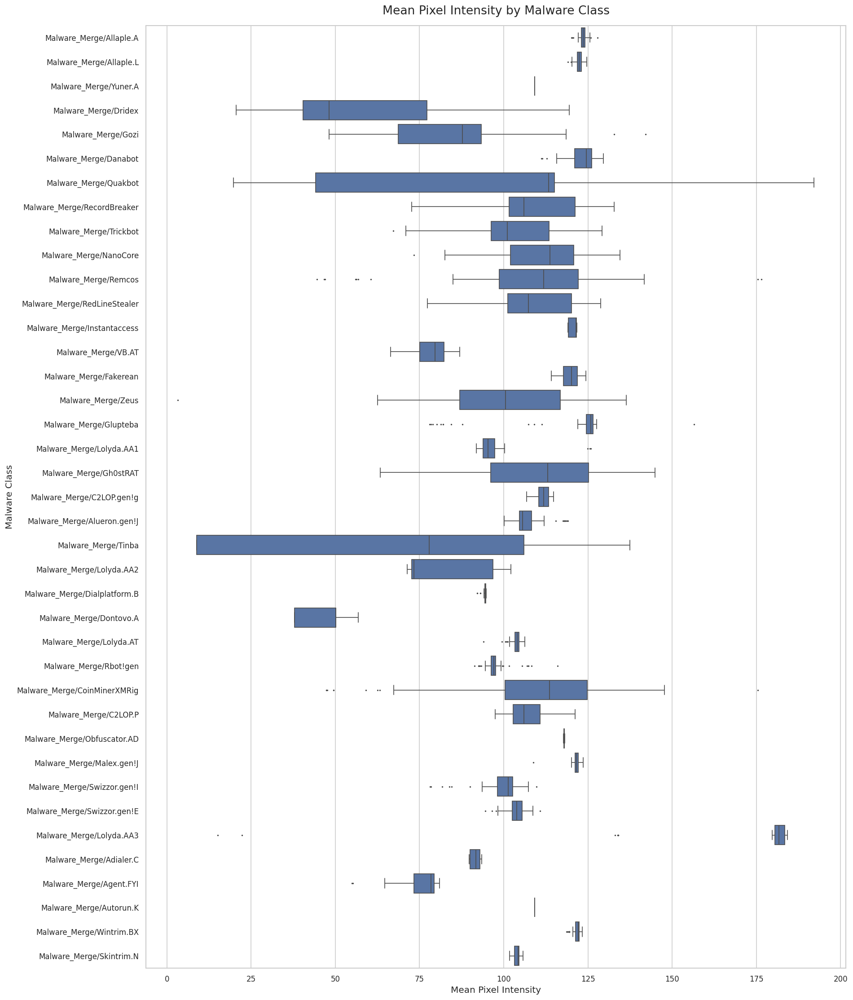

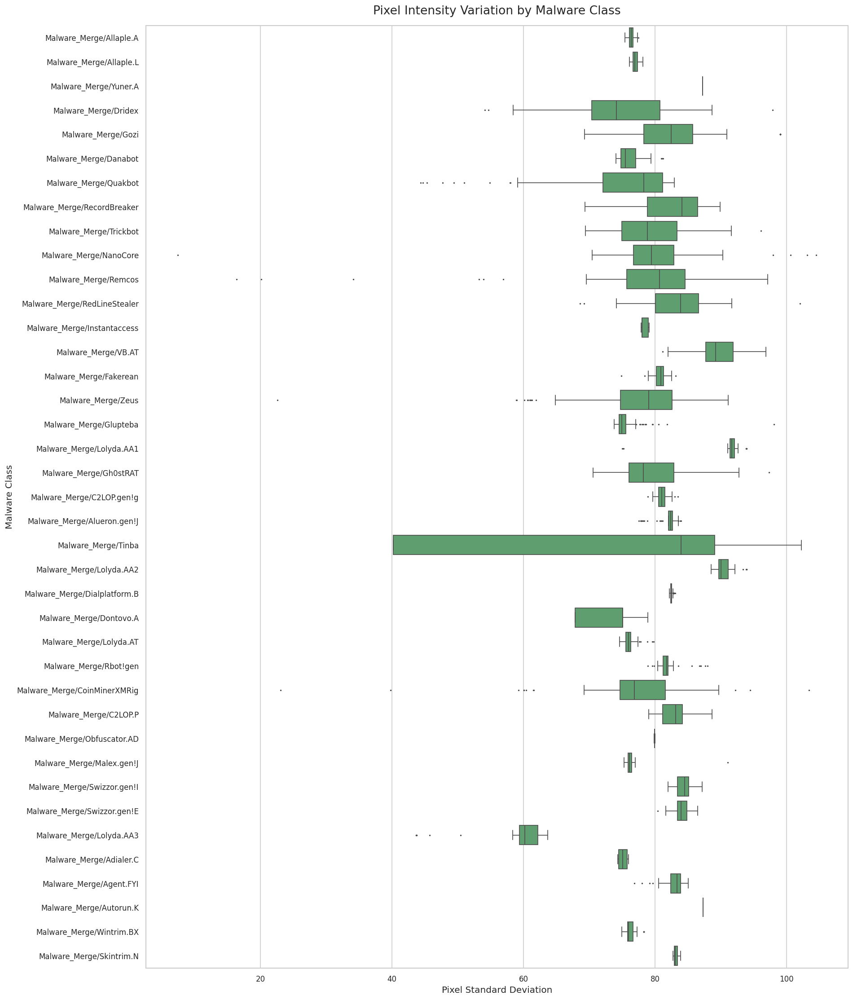

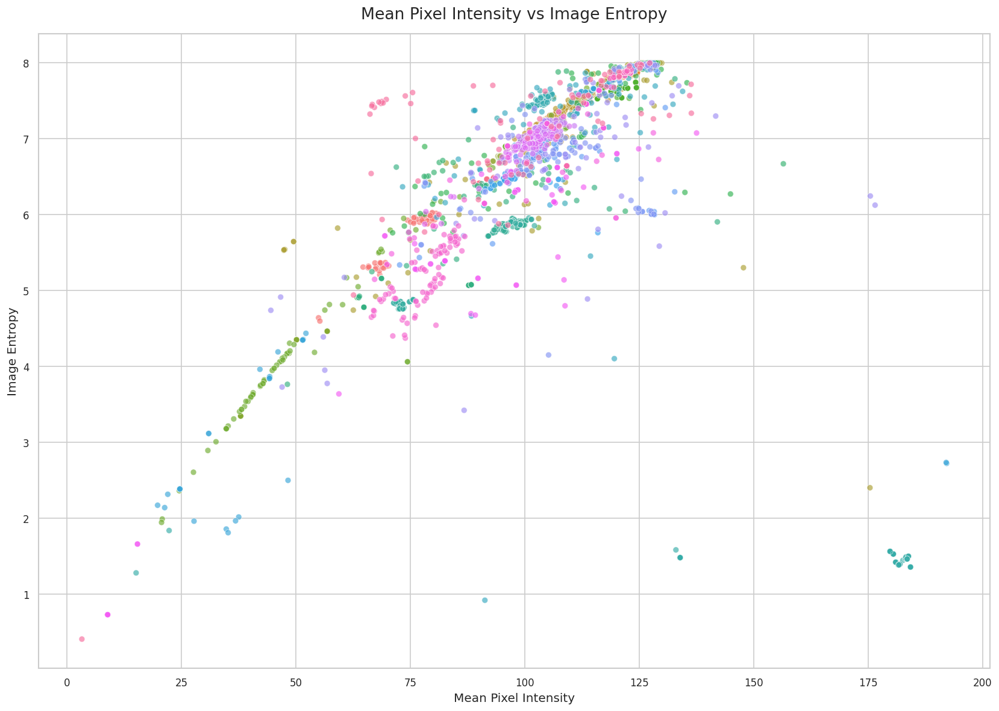

In [12]:
label_order = class_summary["label"].tolist()
plot_height = max(14, len(label_order) * 0.48)

# mean pixel intensity

plt.figure(figsize=(16, plot_height), dpi=120)

sns.boxplot(
    data=pixel_df,
    x="pixel_mean",
    y="label",
    order=label_order,
    color="#4C72B0",
    fliersize=1,
    linewidth=1
)

plt.title("Mean Pixel Intensity by Malware Class", fontsize=16, pad=15)
plt.xlabel("Mean Pixel Intensity", fontsize=12)
plt.ylabel("Malware Class", fontsize=12)
plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.tight_layout()
plt.show()


# pixel variation

plt.figure(figsize=(16, plot_height), dpi=120)

sns.boxplot(
    data=pixel_df,
    x="pixel_std",
    y="label",
    order=label_order,
    color="#55A868",
    fliersize=1,
    linewidth=1
)

plt.title("Pixel Intensity Variation by Malware Class", fontsize=16, pad=15)
plt.xlabel("Pixel Standard Deviation", fontsize=12)
plt.ylabel("Malware Class", fontsize=12)
plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.tight_layout()
plt.show()


# mean intensity versus entropy

plt.figure(figsize=(14, 10), dpi=120)

sns.scatterplot(
    data=pixel_df,
    x="pixel_mean",
    y="entropy",
    hue="label",
    alpha=0.65,
    s=35,
    legend=False
)

plt.title("Mean Pixel Intensity vs Image Entropy", fontsize=16, pad=15)
plt.xlabel("Mean Pixel Intensity", fontsize=12)
plt.ylabel("Image Entropy", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

hashing files:   0%|          | 0/12464 [00:00<?, ?it/s]

duplicate image records: 3,399
duplicate groups: 666


,path,label,filename,sha256
8990,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RedLineStealer,RedLineStealer_315.png,002be45de29f55259ea86fc21fd6b29df64b8c209482dc...
8655,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RecordBreaker,RecordBreaker_315.png,002be45de29f55259ea86fc21fd6b29df64b8c209482dc...
8997,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RedLineStealer,RedLineStealer_132.png,0085d4bbd35057a7c9b996ce9249ac5d782f51cc645652...
8491,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RecordBreaker,RecordBreaker_132.png,0085d4bbd35057a7c9b996ce9249ac5d782f51cc645652...
5178,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Glupteba,Glupteba_195.png,014239aaddc0b3ac8e47ad3a1b1c12092e2a730a97665e...
5108,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Glupteba,Glupteba_59.png,014239aaddc0b3ac8e47ad3a1b1c12092e2a730a97665e...
9210,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RedLineStealer,RedLineStealer_302.png,015ef5410511466c158b101e797be2934fc56c426ab8be...
8768,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RecordBreaker,RecordBreaker_302.png,015ef5410511466c158b101e797be2934fc56c426ab8be...
8684,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RecordBreaker,RecordBreaker_215.png,019f9439fb82ccba71f4bfd0a063470fedf83a3c268ba9...
9244,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/RedLineStealer,RedLineStealer_215.png,019f9439fb82ccba71f4bfd0a063470fedf83a3c268ba9...


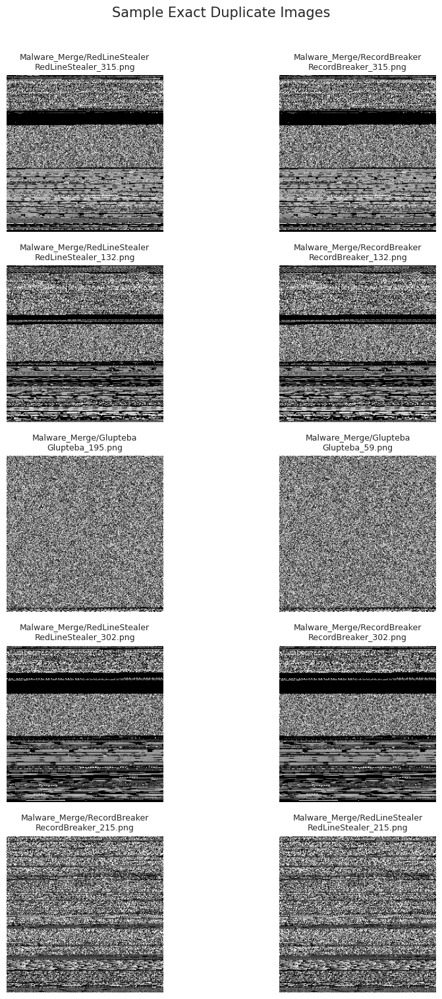

In [13]:
def file_hash(file_path, chunk_size=1024 * 1024):
    digest = hashlib.sha256()

    with open(file_path, "rb") as file:
        while True:
            chunk = file.read(chunk_size)

            if not chunk:
                break

            digest.update(chunk)

    return digest.hexdigest()


hash_df = df[["path", "label", "filename"]].copy()

hash_df["sha256"] = [
    file_hash(path)
    for path in tqdm(hash_df["path"], desc="hashing files")
]

duplicate_df = hash_df[
    hash_df.duplicated("sha256", keep=False)
].sort_values("sha256")

print("duplicate image records:", f"{len(duplicate_df):,}")
print("duplicate groups:", duplicate_df["sha256"].nunique())

if len(duplicate_df) > 0:
    display(duplicate_df.head(20))

    sample_hashes = duplicate_df["sha256"].drop_duplicates().head(5)

    fig, axes = plt.subplots(
        nrows=len(sample_hashes),
        ncols=2,
        figsize=(10, max(4, len(sample_hashes) * 3))
    )

    axes = np.atleast_2d(axes)

    for row_id, image_hash in enumerate(sample_hashes):
        group = duplicate_df[
            duplicate_df["sha256"] == image_hash
        ].head(2)

        for col_id, row in enumerate(group.itertuples(index=False)):
            try:
                with Image.open(row.path) as image:
                    axes[row_id, col_id].imshow(
                        image.convert("L"),
                        cmap="gray"
                    )

                axes[row_id, col_id].set_title(
                    f"{row.label}\n{row.filename}",
                    fontsize=9
                )

            except Exception as error:
                axes[row_id, col_id].text(
                    0.5,
                    0.5,
                    f"Cannot load image\n{error}",
                    ha="center",
                    va="center"
                )

            axes[row_id, col_id].axis("off")

        for col_id in range(len(group), 2):
            axes[row_id, col_id].axis("off")

    plt.suptitle("Sample Exact Duplicate Images", y=1.01, fontsize=15)
    plt.tight_layout()
    plt.show()

else:
    print("No exact duplicate images found.")

In [14]:
if len(duplicate_df):
    leakage_groups = (
        duplicate_df.groupby("sha256")["label"]
        .nunique()
        .sort_values(ascending=False)
    )

    cross_class_duplicates = leakage_groups[leakage_groups > 1]

    print("duplicate groups shared across classes:", len(cross_class_duplicates))

    if len(cross_class_duplicates):
        print("warning: identical files occur in more than one malware class")
else:
    print("no exact file duplicates found")

duplicate groups shared across classes: 499


In [15]:
label_counts = df["label"].value_counts()

too_small = label_counts[label_counts < 3]

if len(too_small):
    print("classes with fewer than 3 images:")
    display(too_small)
    print("these classes should be removed or collected further before splitting")
else:
    train_df, temp_df = train_test_split(
        df,
        test_size=0.30,
        stratify=df["label"],
        random_state=SEED
    )

    val_df, test_df = train_test_split(
        temp_df,
        test_size=0.50,
        stratify=temp_df["label"],
        random_state=SEED
    )

    train_df = train_df.assign(split="train")
    val_df = val_df.assign(split="validation")
    test_df = test_df.assign(split="test")

    split_df = pd.concat([train_df, val_df, test_df], ignore_index=True)

    print(split_df["split"].value_counts())
    display(pd.crosstab(split_df["label"], split_df["split"]))

    split_df.to_csv("/kaggle/working/malebin_split_manifest.csv", index=False)

split
train         8724
validation    1870
test          1870
Name: count, dtype: int64


split,test,train,validation
label,,,
Malware_Merge/Adialer.C,18,85,19
Malware_Merge/Agent.FYI,17,81,18
Malware_Merge/Allaple.A,150,700,150
Malware_Merge/Allaple.L,150,700,150
Malware_Merge/Alueron.gen!J,30,139,29
Malware_Merge/Autorun.K,16,74,16
Malware_Merge/C2LOP.P,22,102,22
Malware_Merge/C2LOP.gen!g,30,140,30
Malware_Merge/CoinMinerXMRig,23,109,24


In [16]:
TARGET_SIZE = (224, 224)

model_ready = image_meta.merge(
    df[["path", "filename", "file_size_kb"]],
    on="path",
    how="left"
)

encoder = LabelEncoder()
model_ready["label_id"] = encoder.fit_transform(model_ready["label"])

model_ready["cnn_ready"] = True
model_ready["suggested_size"] = f"{TARGET_SIZE[0]}x{TARGET_SIZE[1]}"
model_ready["nn_vector_size"] = TARGET_SIZE[0] * TARGET_SIZE[1]

model_ready["gnn_candidate"] = True
model_ready["gnn_note"] = (
    "image-to-graph conversion required: patches, superpixels, or pixel regions"
)

model_ready.to_csv("/kaggle/working/malebin_model_manifest.csv", index=False)

label_map = pd.DataFrame(
    {
        "label": encoder.classes_,
        "label_id": range(len(encoder.classes_)),
    }
)

label_map.to_csv("/kaggle/working/malebin_label_map.csv", index=False)

display(model_ready.head())
display(label_map)

,path,label,width,height,aspect_ratio,mode,pixels,filename,file_size_kb,label_id,cnn_ready,suggested_size,nn_vector_size,gnn_candidate,gnn_note
0,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Adialer.C,256,256,1.0,L,65536,0528185d9960c8bd1b6692d2ccc8b9dd.png,43.902344,0,True,224x224,50176,True,"image-to-graph conversion required: patches, s..."
1,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Adialer.C,256,256,1.0,L,65536,050f962b76f3b115044873d9e3a07a97.png,43.903320,0,True,224x224,50176,True,"image-to-graph conversion required: patches, s..."
2,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Adialer.C,256,256,1.0,L,65536,053f41978f89e436244c691072f4a548.png,43.495117,0,True,224x224,50176,True,"image-to-graph conversion required: patches, s..."
3,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Adialer.C,256,256,1.0,L,65536,06e21af7e2fdd67622d0122e113b0d53.png,43.627930,0,True,224x224,50176,True,"image-to-graph conversion required: patches, s..."
4,/kaggle/input/datasets/tashiee/malebin-malware...,Malware_Merge/Adialer.C,256,256,1.0,L,65536,01691141ed365252bbe290bb7841c0c5.png,43.410156,0,True,224x224,50176,True,"image-to-graph conversion required: patches, s..."


,label,label_id
0,Malware_Merge/Adialer.C,0
1,Malware_Merge/Agent.FYI,1
2,Malware_Merge/Allaple.A,2
3,Malware_Merge/Allaple.L,3
4,Malware_Merge/Alueron.gen!J,4
5,Malware_Merge/Autorun.K,5
6,Malware_Merge/C2LOP.P,6
7,Malware_Merge/C2LOP.gen!g,7
8,Malware_Merge/CoinMinerXMRig,8
9,Malware_Merge/Danabot,9


In [17]:
n_images = len(df)
n_classes = df["label"].nunique()
min_class = class_summary["images"].min()
max_class = class_summary["images"].max()
common_resolution_share = (
    image_meta.groupby(["width", "height"])
    .size()
    .max()
    / len(image_meta)
    * 100
)

print("EDA decision summary")
print("-" * 55)
print(f"images: {n_images:,}")
print(f"malware classifications: {n_classes}")
print(f"class range: {min_class:,} to {max_class:,} images")
print(f"class imbalance ratio: {imbalance_ratio:.2f}")
print(f"most common resolution share: {common_resolution_share:.2f}%")
print(f"corrupt images: {len(corrupt_df):,}")
print(f"exact duplicate records: {len(duplicate_df):,}")

if imbalance_ratio > 5:
    print("\nopinion: class imbalance is substantial.")
    print("use stratified splits, class weights, focal loss, or balanced sampling.")
else:
    print("\nopinion: class distribution is reasonably manageable.")

if common_resolution_share < 80:
    print("image dimensions are varied, so resizing and padding policy must be documented.")
else:
    print("image dimensions are mostly consistent, which is favorable for CNN training.")

if len(corrupt_df) > 0:
    print("remove unreadable images before model training.")

if len(duplicate_df) > 0:
    print("deduplicate before splitting to reduce data leakage risk.")

print(
    "\nresearch suitability: suitable for CNN-based malware-family classification "
    "after leakage checks, stratified splitting, and imbalance handling."
)
print(
    "GNN suitability: possible, but not native. A graph construction method must "
    "be justified before claiming a GNN comparison."
)

EDA decision summary
-------------------------------------------------------
images: 12,464
malware classifications: 39
class range: 80 to 1,000 images
class imbalance ratio: 12.50
most common resolution share: 100.00%
corrupt images: 0
exact duplicate records: 3,399

opinion: class imbalance is substantial.
use stratified splits, class weights, focal loss, or balanced sampling.
image dimensions are mostly consistent, which is favorable for CNN training.
deduplicate before splitting to reduce data leakage risk.

research suitability: suitable for CNN-based malware-family classification after leakage checks, stratified splitting, and imbalance handling.
GNN suitability: possible, but not native. A graph construction method must be justified before claiming a GNN comparison.


In [18]:
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px

In [19]:
feature_columns = [
    "pixel_mean",
    "pixel_std",
    "pixel_min",
    "pixel_max",
    "dark_pixel_ratio",
    "bright_pixel_ratio",
    "entropy",
]

statistics_table = pixel_df[feature_columns].describe().T

statistics_table["median"] = pixel_df[feature_columns].median()
statistics_table["skewness"] = pixel_df[feature_columns].skew()
statistics_table["kurtosis"] = pixel_df[feature_columns].kurt()

statistics_table = statistics_table[
    ["count", "mean", "median", "std", "min", "25%", "50%", "75%", "max", "skewness", "kurtosis"]
].round(4)

statistics_table

,count,mean,median,std,min,25%,50%,75%,max,skewness,kurtosis
pixel_mean,3120.0,103.3368,106.1260,26.1514,3.2316,94.3806,106.1260,120.1072,192.1334,-0.5387,2.8480
pixel_std,3120.0,79.7372,80.7477,8.4799,7.4531,76.1320,80.7477,84.0259,104.4650,-2.0654,9.5853
pixel_min,3120.0,0.0138,0.0000,0.7699,0.0000,0.0000,0.0000,0.0000,43.0000,55.8570,3120.0000
pixel_max,3120.0,254.9574,255.0000,2.3811,122.0000,255.0000,255.0000,255.0000,255.0000,-55.8570,3120.0000
dark_pixel_ratio,3120.0,0.3441,0.3081,0.1477,0.0034,0.2430,0.3081,0.3769,0.9788,1.5582,3.1651
bright_pixel_ratio,3120.0,0.1562,0.1674,0.0543,0.0000,0.1390,0.1674,0.1878,0.8022,1.0388,18.9503
entropy,3120.0,6.5953,7.0175,1.5253,0.4107,6.1449,7.0175,7.7017,7.9975,-1.9061,3.7715


In [20]:
quality_table = pd.DataFrame(
    {
        "feature": feature_columns,
        "missing_count": [pixel_df[col].isna().sum() for col in feature_columns],
        "missing_percent": [
            round(pixel_df[col].isna().mean() * 100, 4)
            for col in feature_columns
        ],
        "unique_values": [pixel_df[col].nunique() for col in feature_columns],
        "variance": [pixel_df[col].var() for col in feature_columns],
    }
)

near_constant_features = quality_table[
    quality_table["variance"] < 1e-8
]["feature"].tolist()

quality_table["near_constant"] = quality_table["feature"].isin(
    near_constant_features
)

quality_table

,feature,missing_count,missing_percent,unique_values,variance,near_constant
0,pixel_mean,0,0.0,2712,683.897156,False
1,pixel_std,0,0.0,2711,71.908974,False
2,pixel_min,0,0.0,2,0.592670,False
3,pixel_max,0,0.0,2,5.669657,False
4,dark_pixel_ratio,0,0.0,2339,0.021808,False
5,bright_pixel_ratio,0,0.0,2018,0.002949,False
6,entropy,0,0.0,2717,2.326574,False


In [21]:
outlier_records = []

for feature in feature_columns:
    q1 = pixel_df[feature].quantile(0.25)
    q3 = pixel_df[feature].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outlier_count = (
        (pixel_df[feature] < lower_bound)
        | (pixel_df[feature] > upper_bound)
    ).sum()

    outlier_records.append(
        {
            "feature": feature,
            "lower_bound": round(lower_bound, 4),
            "upper_bound": round(upper_bound, 4),
            "outlier_count": int(outlier_count),
            "outlier_percent": round(outlier_count / len(pixel_df) * 100, 2),
        }
    )

outlier_table = pd.DataFrame(outlier_records)
outlier_table

,feature,lower_bound,upper_bound,outlier_count,outlier_percent
0,pixel_mean,55.7907,158.6971,260,8.33
1,pixel_std,64.2911,95.8667,191,6.12
2,pixel_min,0.0000,0.0000,1,0.03
3,pixel_max,255.0000,255.0000,1,0.03
4,dark_pixel_ratio,0.0421,0.5778,219,7.02
5,bright_pixel_ratio,0.0659,0.2609,262,8.40
6,entropy,3.8095,10.0371,195,6.25


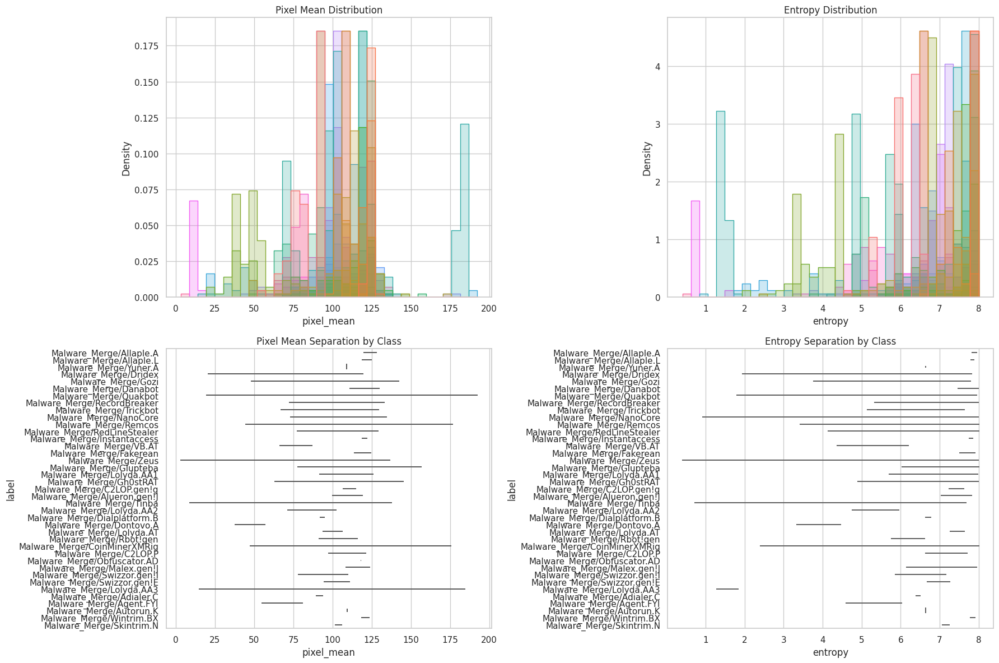

In [22]:
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.histplot(
    data=pixel_df,
    x="pixel_mean",
    hue="label",
    bins=35,
    element="step",
    stat="density",
    common_norm=False,
    legend=False,
    ax=axes[0, 0]
)

sns.histplot(
    data=pixel_df,
    x="entropy",
    hue="label",
    bins=35,
    element="step",
    stat="density",
    common_norm=False,
    legend=False,
    ax=axes[0, 1]
)

sns.violinplot(
    data=pixel_df,
    x="pixel_mean",
    y="label",
    order=class_summary["label"].tolist(),
    inner="quartile",
    cut=0,
    color="#8172B2",
    ax=axes[1, 0]
)

sns.violinplot(
    data=pixel_df,
    x="entropy",
    y="label",
    order=class_summary["label"].tolist(),
    inner="quartile",
    cut=0,
    color="#CCB974",
    ax=axes[1, 1]
)

axes[0, 0].set_title("Pixel Mean Distribution")
axes[0, 1].set_title("Entropy Distribution")
axes[1, 0].set_title("Pixel Mean Separation by Class")
axes[1, 1].set_title("Entropy Separation by Class")

plt.tight_layout()
plt.show()

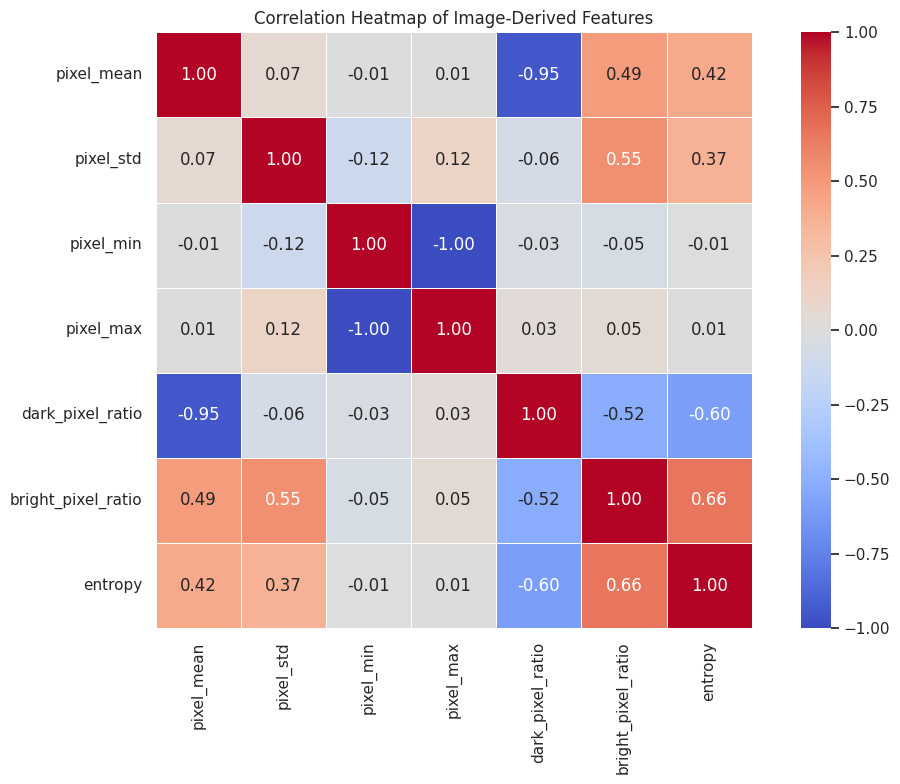

,feature_1,feature_2,correlation
0,pixel_mean,dark_pixel_ratio,-0.9493
1,pixel_min,pixel_max,-1.0000


In [23]:
correlation_matrix = pixel_df[feature_columns].corr()

plt.figure(figsize=(11, 8))

sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5
)

plt.title("Correlation Heatmap of Image-Derived Features")
plt.tight_layout()
plt.show()


high_correlation_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        value = correlation_matrix.iloc[i, j]

        if abs(value) >= 0.85:
            high_correlation_pairs.append(
                {
                    "feature_1": correlation_matrix.columns[i],
                    "feature_2": correlation_matrix.columns[j],
                    "correlation": round(value, 4),
                }
            )

redundant_features = pd.DataFrame(high_correlation_pairs)
redundant_features

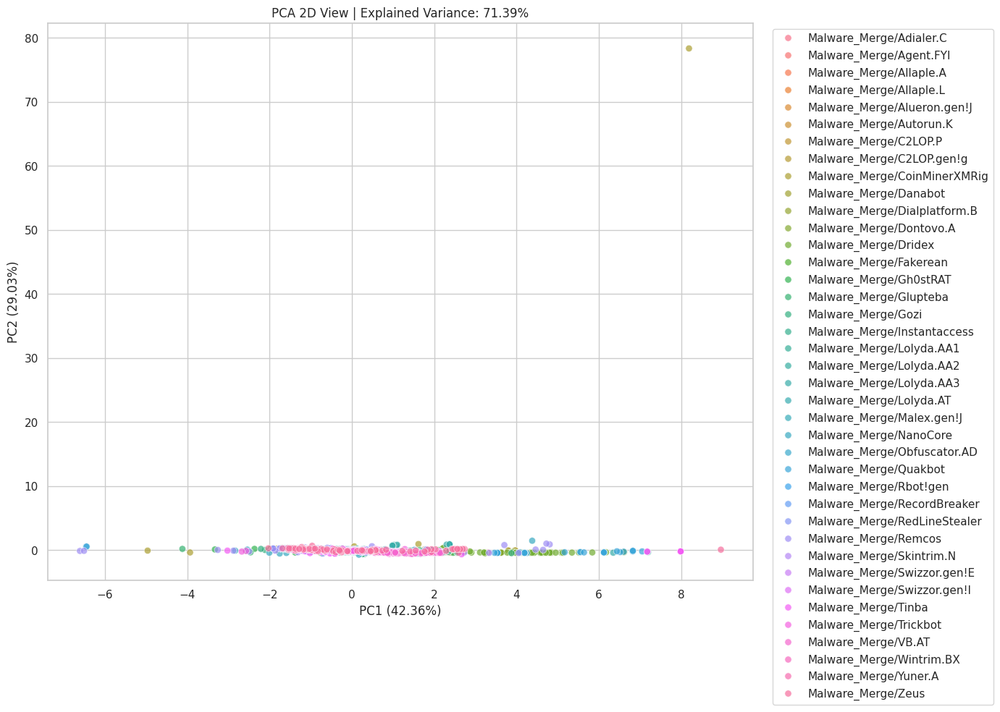

In [24]:
pca_features = pixel_df[feature_columns].replace(
    [np.inf, -np.inf],
    np.nan
).dropna()

pca_labels = pixel_df.loc[pca_features.index, "label"]

scaled_features = StandardScaler().fit_transform(pca_features)

pca_2d = PCA(n_components=2, random_state=SEED)
pca_2d_result = pca_2d.fit_transform(scaled_features)

pca_df = pd.DataFrame(
    {
        "pca_1": pca_2d_result[:, 0],
        "pca_2": pca_2d_result[:, 1],
        "label": pca_labels.values,
    }
)

plt.figure(figsize=(14, 10))

sns.scatterplot(
    data=pca_df,
    x="pca_1",
    y="pca_2",
    hue="label",
    alpha=0.7,
    s=45,
    legend="full"
)

plt.title(
    f"PCA 2D View | Explained Variance: "
    f"{pca_2d.explained_variance_ratio_.sum() * 100:.2f}%"
)

plt.xlabel(f"PC1 ({pca_2d.explained_variance_ratio_[0] * 100:.2f}%)")
plt.ylabel(f"PC2 ({pca_2d.explained_variance_ratio_[1] * 100:.2f}%)")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [25]:
pca_3d = PCA(n_components=3, random_state=SEED)
pca_3d_result = pca_3d.fit_transform(scaled_features)

pca_3d_df = pd.DataFrame(
    {
        "pca_1": pca_3d_result[:, 0],
        "pca_2": pca_3d_result[:, 1],
        "pca_3": pca_3d_result[:, 2],
        "label": pca_labels.values,
    }
)

fig = px.scatter_3d(
    pca_3d_df,
    x="pca_1",
    y="pca_2",
    z="pca_3",
    color="label",
    opacity=0.7,
    title="Interactive 3D PCA View of Malware Classes",
    hover_data=["label"]
)

fig.update_traces(marker={"size": 4})
fig.show()

In [26]:
fig = px.scatter(
    pixel_df,
    x="pixel_mean",
    y="entropy",
    color="label",
    size="pixel_std",
    hover_data=[
        "label",
        "pixel_mean",
        "pixel_std",
        "dark_pixel_ratio",
        "bright_pixel_ratio",
        "entropy",
    ],
    title="Interactive Pixel Intensity, Entropy, and Variation View"
)

fig.update_layout(
    width=1200,
    height=750,
    legend_title_text="Malware Class"
)

fig.show()